<a href="https://colab.research.google.com/github/jiobu1/DS-Unit-2-Linear-Models/blob/master/Jisha_Obukwelu_DSPT3_211_Regression_Classification_Assignment1.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Lambda School Data Science

*Unit 2, Sprint 1, Module 1*

---

# Regression 1

## Assignment

You'll use another **New York City** real estate dataset. 

But now you'll **predict how much it costs to rent an apartment**, instead of how much it costs to buy a condo.

The data comes from renthop.com, an apartment listing website.

- [ ] Look at the data. Choose a feature, and plot its relationship with the target.
- [ ] Use scikit-learn for linear regression with one feature. You can follow the [5-step process from Jake VanderPlas](https://jakevdp.github.io/PythonDataScienceHandbook/05.02-introducing-scikit-learn.html#Basics-of-the-API).
- [ ] Define a function to make new predictions and explain the model coefficient.
- [ ] Organize and comment your code.

> [Do Not Copy-Paste.](https://docs.google.com/document/d/1ubOw9B3Hfip27hF2ZFnW3a3z9xAgrUDRReOEo-FHCVs/edit) You must type each of these exercises in, manually. If you copy and paste, you might as well not even do them. The point of these exercises is to train your hands, your brain, and your mind in how to read, write, and see code. If you copy-paste, you are cheating yourself out of the effectiveness of the lessons.

## Stretch Goals
- [ ] Do linear regression with two or more features.
- [ ] Read [The Discovery of Statistical Regression](https://priceonomics.com/the-discovery-of-statistical-regression/)
- [ ] Read [_An Introduction to Statistical Learning_](http://faculty.marshall.usc.edu/gareth-james/ISL/ISLR%20Seventh%20Printing.pdf), Chapter 2.1: What Is Statistical Learning?

In [0]:
import sys

# If you're on Colab:
if 'google.colab' in sys.modules:
    DATA_PATH = 'https://raw.githubusercontent.com/LambdaSchool/DS-Unit-2-Applied-Modeling/master/data/'

# If you're working locally:
else:
    DATA_PATH = '../data/'
    
# Ignore this Numpy warning when using Plotly Express:
# FutureWarning: Method .ptp is deprecated and will be removed in a future version. Use numpy.ptp instead.
import warnings
warnings.filterwarnings(action='ignore', category=FutureWarning, module='numpy')

In [0]:
# Read New York City apartment rental listing data
import pandas as pd
df = pd.read_csv(DATA_PATH+'apartments/renthop-nyc.csv')
assert df.shape == (49352, 34)

In [0]:
# Remove outliers: 
# the most extreme 1% prices,
# the most extreme .1% latitudes, &
# the most extreme .1% longitudes
df = df[(df['price'] >= 1375) & (df['price'] <= 15500) & 
        (df['latitude'] >=40.57) & (df['latitude'] < 40.99) &
        (df['longitude'] >= -74.1) & (df['longitude'] <= -73.38)]

In [4]:
df.isnull().sum()

bathrooms                  0
bedrooms                   0
created                    0
description             1425
display_address          133
latitude                   0
longitude                  0
price                      0
street_address            10
interest_level             0
elevator                   0
cats_allowed               0
hardwood_floors            0
dogs_allowed               0
doorman                    0
dishwasher                 0
no_fee                     0
laundry_in_building        0
fitness_center             0
pre-war                    0
laundry_in_unit            0
roof_deck                  0
outdoor_space              0
dining_room                0
high_speed_internet        0
balcony                    0
swimming_pool              0
new_construction           0
terrace                    0
exclusive                  0
loft                       0
garden_patio               0
wheelchair_access          0
common_outdoor_space       0
dtype: int64

In [5]:
df.head()

,bathrooms,bedrooms,created,description,display_address,latitude,longitude,price,street_address,interest_level,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
0,1.5,3,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,40.7145,-73.9425,3000,792 Metropolitan Avenue,medium,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1.0,2,2016-06-12 12:19:27,,Columbus Avenue,40.7947,-73.9667,5465,808 Columbus Avenue,low,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1.0,1,2016-04-17 03:26:41,"Top Top West Village location, beautiful Pre-w...",W 13 Street,40.7388,-74.0018,2850,241 W 13 Street,high,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1.0,1,2016-04-18 02:22:02,Building Amenities - Garage - Garden - fitness...,East 49th Street,40.7539,-73.9677,3275,333 East 49th Street,low,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1.0,4,2016-04-28 01:32:41,Beautifully renovated 3 bedroom flex 4 bedroom...,West 143rd Street,40.8241,-73.9493,3350,500 West 143rd Street,low,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [6]:
df.describe()

,bathrooms,bedrooms,latitude,longitude,price,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
count,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.000000,48818.00000,48818.000000,48818.000000
mean,1.201790,1.537158,40.750756,-73.972758,3579.560982,0.524827,0.478266,0.478266,0.447622,0.424843,0.415072,0.367078,0.052767,0.268446,0.185649,0.175898,0.132758,0.138392,0.102831,0.087201,0.060469,0.055205,0.051907,0.046192,0.043304,0.042710,0.03933,0.027224,0.026240
std,0.470707,1.106078,0.038962,0.028887,1762.420875,0.499388,0.499533,0.499533,0.497254,0.494324,0.492740,0.482013,0.223571,0.443156,0.388827,0.380737,0.339317,0.345314,0.303741,0.282133,0.238357,0.228382,0.221842,0.209903,0.203542,0.202204,0.19438,0.162736,0.159851
min,0.000000,0.000000,40.571200,-74.087300,1375.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
25%,1.000000,1.000000,40.728300,-73.991800,2500.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
50%,1.000000,1.000000,40.751700,-73.978000,3150.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
75%,1.000000,2.000000,40.774000,-73.955000,4095.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000
max,10.000000,8.000000,40.989400,-73.700100,15500.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000


####Look at the data. Choose a feature, and plot its relationship with the target.

In [7]:
df['price'].describe()

count    48818.000000
mean      3579.560982
std       1762.420875
min       1375.000000
25%       2500.000000
50%       3150.000000
75%       4095.000000
max      15500.000000
Name: price, dtype: float64

In [8]:
guess = df['price'].mean()
errors = guess - df['price']
mean_absolute_error = errors.abs().mean()

print(f"If we guessed every Manhattan apartment's rental price is ${guess:,.0f}.")
print(f'We would be off by ${mean_absolute_error:,.0f} on average.')

If we guessed every Manhattan apartment's rental price is $3,580.
We would be off by $1,202 on average.


In [9]:
import plotly.express as px
px.scatter(df, x='bedrooms', y='price', trendline='ols')

This is strange, the number of bedrooms does not seem to be as big a factor on price. Being a New Yorker, this is not as strange as it seems, real estate in New York, is all about 3 things: LOCATION! LOCATION! LOCATION!

In [10]:
px.scatter(df, x='longitude', y='price', trendline='ols')

In [11]:
px.scatter(df, x ='latitude', y='price', trendline='ols')

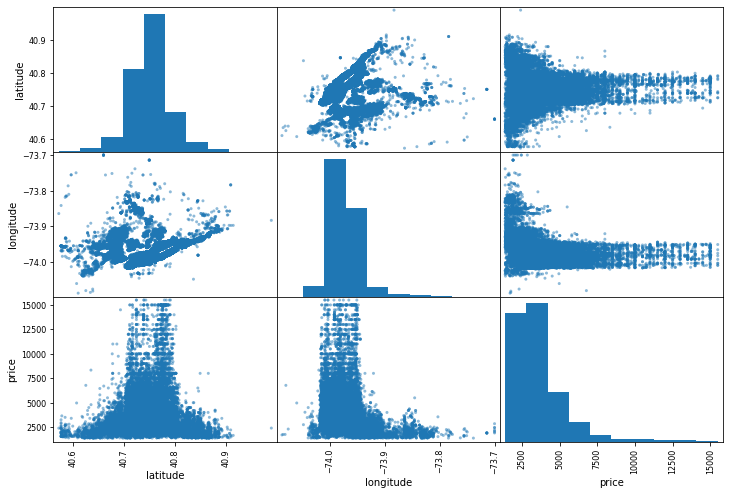

In [12]:
from pandas.plotting import scatter_matrix
attributes = ['latitude', 'longitude', 'price']
scatter_matrix(df[attributes], figsize=(12, 8));

In [13]:
corr_matrix=df.corr()
corr_matrix['price'].sort_values(ascending=False)

price                   1.000000
bathrooms               0.687297
bedrooms                0.535494
doorman                 0.276224
laundry_in_unit         0.271200
dining_room             0.242915
fitness_center          0.228782
dishwasher              0.223908
elevator                0.207180
terrace                 0.145975
outdoor_space           0.142151
balcony                 0.139142
swimming_pool           0.134516
no_fee                  0.132249
roof_deck               0.122933
garden_patio            0.103675
hardwood_floors         0.101515
high_speed_internet     0.090273
wheelchair_access       0.072519
new_construction        0.071433
dogs_allowed            0.060412
cats_allowed            0.051465
common_outdoor_space    0.011519
loft                    0.007103
exclusive              -0.013248
laundry_in_building    -0.019414
pre-war                -0.029115
latitude               -0.036214
longitude              -0.251018
Name: price, dtype: float64

This totally blew my hypothesis, bathrooms seems to be the main factor in price. 

In [14]:
df.bathrooms.unique()

array([ 1.5,  1. ,  2. ,  3.5,  3. ,  2.5,  0. ,  4. , 10. ,  4.5,  5. ])

In [15]:
df.loc[df['bathrooms'] ==10] # This does not make sense 2 bedroom and 10 bathrooms?

,bathrooms,bedrooms,created,description,display_address,latitude,longitude,price,street_address,interest_level,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space
1990,10.0,2,2016-04-09 04:34:31,***The building?s well-attended lobby welcomes...,W 52 St.,40.7633,-73.9849,3600,260 W 52 St.,low,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [16]:
px.scatter(df, x='bathrooms', y='price', trendline='ols')

####Use scikit-learn for linear regression with one feature. 

In [0]:
# 1. Import the appropriate estimator class from Scikit-Learn
from sklearn.linear_model import LinearRegression

In [0]:
# 2. Instantiate this class
model = LinearRegression()

In [0]:
# 3. Arrange X features matrix & y target vector
features1 = ['bathrooms']
target1 = 'price'

X = df[features1]
Y = df[target1]

In [20]:
# 4. Fit the model
model.fit(X,Y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [21]:
# 5. Apply the model to new data
bathrooms = 5
X_test = [[bathrooms]]
y_pred = model.predict(X_test)

print (f'predicted rental price is ${y_pred[0]} for a {bathrooms} bathrooms in a Manhattan apartment.')

predicted rental price is $13353.776510937521 for a 5 bathrooms in a Manhattan apartment.


####Define a function to make new predictions and explain the model coefficient.

In [22]:
model.coef_

array([2573.37439508])

In [42]:
def prediction(bathroom):
  Y_pred = model.predict([[bathroom]])
  estimate = Y_pred[0]
  coefficient = model.coef_[0]
  result = f'${estimate:,.0f} estimated price for {bathroom:,.0f} bathrooms in Manhattan.'
  explanation = f'In this linear regression, each additional bathroom adds ${coefficient:,.0f}.'
  return result + explanation

prediction(1)

'$3,060 estimated price for 1 bathrooms in Manhattan.In this linear regression, each additional bathroom adds $2,573.'

In [24]:
prediction(5)

'$13,354 estimated price for 5 bathrooms in Manhattan.In this linear regression, each additional bathroom adds $2,573.'

In [25]:
from ipywidgets  import interact
interact(prediction, bathroom=(1, 10));

interactive(children=(IntSlider(value=5, description='bathroom', max=10, min=1), Output()), _dom_classes=('wid…

I don't totally believe this, let me check latitude and longitude using sns.scatterplot.

In [0]:
import matplotlib.pyplot as plt
import seaborn as sns

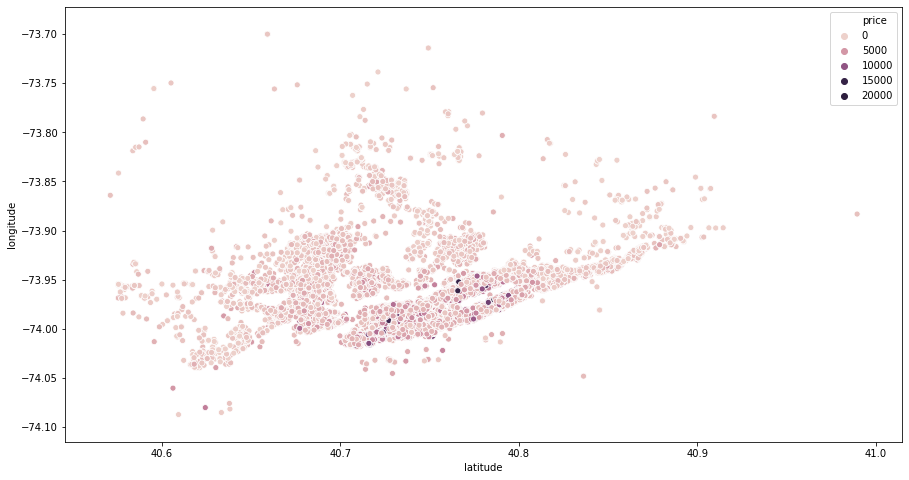

In [27]:
plt.figure(figsize=(15,8))
sns.scatterplot(x='latitude', 
                y='longitude', 
                hue='price',
                data = df);

This is a cool graph, but I cannot truly highlight price with this graph.

####STRETCH
Do linear regression with two or more features.

In [0]:
#2. Instantiate this class
features_model = LinearRegression()

In [29]:
df.columns

Index(['bathrooms', 'bedrooms', 'created', 'description', 'display_address',
       'latitude', 'longitude', 'price', 'street_address', 'interest_level',
       'elevator', 'cats_allowed', 'hardwood_floors', 'dogs_allowed',
       'doorman', 'dishwasher', 'no_fee', 'laundry_in_building',
       'fitness_center', 'pre-war', 'laundry_in_unit', 'roof_deck',
       'outdoor_space', 'dining_room', 'high_speed_internet', 'balcony',
       'swimming_pool', 'new_construction', 'terrace', 'exclusive', 'loft',
       'garden_patio', 'wheelchair_access', 'common_outdoor_space'],
      dtype='object')

In [0]:
# 3. Arrange X features matrix & y target vector
#Let's look at multiple features
features2 = df[['bathrooms', 'elevator', 'bedrooms','hardwood_floors', ]].values
target2 = df['price'].values

In [48]:
#Let's put these features in a DataFrame
X_features = pd.DataFrame(data = features2)

X_features.head()

,0,1,2,3
0,1.5,0.0,3.0,0.0
1,1.0,1.0,2.0,0.0
2,1.0,0.0,1.0,1.0
3,1.0,0.0,1.0,1.0
4,1.0,0.0,4.0,0.0


In [63]:
X_features.columns = ['bathrooms', 'elevator', 'bedrooms','hardwood_floors']
X_features.head()

,bathrooms,elevator,bedrooms,hardwood_floors
0,1.5,0.0,3.0,0.0
1,1.0,1.0,2.0,0.0
2,1.0,0.0,1.0,1.0
3,1.0,0.0,1.0,1.0
4,1.0,0.0,4.0,0.0


In [64]:
#4. Fit the model
features_model.fit(X_features, target2)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [65]:
features_model.coef_

array([1992.0020584 ,  519.06044792,  417.12388942,  -53.37318903])

In [66]:
#Let's see what the coefficients of this data frame is in reference to price
coef = pd.DataFrame(features_model.coef_, X_features.columns, columns=['price'])
coef

,price
bathrooms,1992.002058
elevator,519.060448
bedrooms,417.123889
hardwood_floors,-53.373189


In [69]:
len(target2)

48818

In [0]:
#5 Apply model to new data
y_pred = features_model.predict(X_features)

In [68]:
print(y_pred)

[4536.89114185 3642.82667115 2653.26914477 ... 3225.70278173 2808.5788923
 3070.39303419]


In [74]:
features_df = X_features
features_df.shape

(48818, 4)

In [0]:
features_df['actual price'] = target2
features_df['predicted price'] = y_pred

In [77]:
features_df.shape

(48818, 6)

In [80]:
px.scatter(features_df, x = 'actual price', y = 'predicted price', trendline ='ols')

####Haversine Formula

(Thank you Stephen P.)

In [0]:
from math import radians, cos, sin, asin, sqrt

def single_pt_haversine(lat, lng, degrees=True):
    """
    'Single-point' Haversine: Calculates the great circle distance
    between a point on Earth and the (0, 0) lat-long coordinate
    """
    r = 6371 # Earth's radius (km). Have r = 3956 if you want miles

    # Convert decimal degrees to radians
    if degrees:
        lat, lng = map(radians, [lat, lng])

    # 'Single-point' Haversine formula
    a = sin(lat/2)**2 + cos(lat) * sin(lng/2)**2
    d = 2 * r * asin(sqrt(a)) 

    return d

In [0]:
df['haversine point'] = [single_pt_haversine(x, y) for x, y in zip(df.latitude, df.longitude)]

In [83]:
df.head()

,bathrooms,bedrooms,created,description,display_address,latitude,longitude,price,street_address,interest_level,elevator,cats_allowed,hardwood_floors,dogs_allowed,doorman,dishwasher,no_fee,laundry_in_building,fitness_center,pre-war,laundry_in_unit,roof_deck,outdoor_space,dining_room,high_speed_internet,balcony,swimming_pool,new_construction,terrace,exclusive,loft,garden_patio,wheelchair_access,common_outdoor_space,haversine point
0,1.5,3,2016-06-24 07:54:24,A Brand New 3 Bedroom 1.5 bath ApartmentEnjoy ...,Metropolitan Avenue,40.7145,-73.9425,3000,792 Metropolitan Avenue,medium,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8661.842498
1,1.0,2,2016-06-12 12:19:27,,Columbus Avenue,40.7947,-73.9667,5465,808 Columbus Avenue,low,1,1,0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8665.491494
2,1.0,1,2016-04-17 03:26:41,"Top Top West Village location, beautiful Pre-w...",W 13 Street,40.7388,-74.0018,2850,241 W 13 Street,high,0,0,1,0,0,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8667.251778
3,1.0,1,2016-04-18 02:22:02,Building Amenities - Garage - Garden - fitness...,East 49th Street,40.7539,-73.9677,3275,333 East 49th Street,low,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8664.737441
4,1.0,4,2016-04-28 01:32:41,Beautifully renovated 3 bedroom flex 4 bedroom...,West 143rd Street,40.8241,-73.9493,3350,500 West 143rd Street,low,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,8664.656031


In [85]:
px.scatter(df, x='price', y='haversine point', trendline='ols')

####Create function that will do this automatically 